## Project Machine learning for intelligente trasportation by Andrea Paletto

## Connect to Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


## Importing the libraries

In [ ]:
import h5py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px

from sklearn.model_selection import train_test_split
from skimage.transform import resize

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras import backend as K
from tensorflow.keras.applications import VGG16
from tensorflow.keras.metrics import MeanIoU
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import f1_score
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Input,
    Conv2D,
    MaxPooling2D,
    Dropout,
    UpSampling2D,
    concatenate,
    Cropping2D,
    Flatten,
)


In [ ]:
import zipfile

# Specify the path to the zip file
zip_file_path = '/content/drive/MyDrive/Colab Notebooks/test/tree_test.h5.zip'  # Replace with your actual zip file path

# Specify the directory where you want to extract the files
extract_dir = '/content/drive/MyDrive/Colab Notebooks/test/tree_test.h5'  # Replace with your desired extraction directory path

# Open the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    # Extract all the contents to the specified directory
    zip_ref.extractall(extract_dir)

# Print a message to indicate that the extraction is complete
print("Extraction complete.")


Extraction complete.


In [ ]:
import zipfile

# Specify the path to the zip file
zip_file_path = '/content/drive/MyDrive/Colab Notebooks/test/tree_train.h5.zip'  # Replace with your actual zip file path

# Specify the directory where you want to extract the files
extract_dir = '/content/drive/MyDrive/Colab Notebooks/test/tree_train.h5'  # Replace with your desired extraction directory path

# Open the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    # Extract all the contents to the specified directory
    zip_ref.extractall(extract_dir)

# Print a message to indicate that the extraction is complete
print("Extraction complete.")


Extraction complete.


## Load training and test data and split it

In [ ]:
# Load data file
with h5py.File('/content/drive/MyDrive/Colab Notebooks/test/tree_train.h5/tree_train.h5', 'r') as hdf_train:
    X_train = hdf_train['X'][:]
    y_train = hdf_train['y'][:]

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

In [ ]:
# Load validation data file
with h5py.File('/content/drive/MyDrive/Colab Notebooks/test/tree_test.h5/tree_test.h5', 'r') as hdf_test:
    X_test = hdf_test['X'][:]

## U-Net definition

In [ ]:
# Define the U-Net architecture
def unet(dropout=False, filters=16):
    inputs = Input(shape=(128, 128, 3))

    # Contracting path
    conv1 = Conv2D(filters, 3, activation='relu', padding='same')(inputs)
    conv1 = Conv2D(filters, 3, activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(filters*2, 3, activation='relu', padding='same')(pool1)
    conv2 = Conv2D(filters*2, 3, activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    # Middle part
    conv3 = Conv2D(filters*4, 3, activation='relu', padding='same')(pool2)
    conv3 = Conv2D(filters*4, 3, activation='relu', padding='same')(conv3)

    # Expansive path
    up4 = UpSampling2D(size=(2, 2))(conv3)
    up4 = Conv2D(filters*2, 2, activation='relu', padding='same')(up4)
    merge4 = concatenate([conv2, up4], axis=3)
    conv4 = Conv2D(filters*2, 3, activation='relu', padding='same')(merge4)
    conv4 = Conv2D(filters*2, 3, activation='relu', padding='same')(conv4)

    up5 = UpSampling2D(size=(2, 2))(conv4)
    up5 = Conv2D(filters, 2, activation='relu', padding='same')(up5)
    merge5 = concatenate([conv1, up5], axis=3)
    conv5 = Conv2D(filters, 3, activation='relu', padding='same')(merge5)
    conv5 = Conv2D(filters, 3, activation='relu', padding='same')(conv5)

    # Output layer
    outputs = Conv2D(1, 1, activation='sigmoid')(conv5)

    model = Model(inputs=inputs, outputs=outputs)

    # Optional dropout
    if dropout:
        conv2 = Dropout(0.5)(conv2)
        conv4 = Dropout(0.5)(conv4)

    return model

In [ ]:
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model
# Create the U-Net model
model = unet()

# Print the model summary
model.summary()

# Plot the model architecture and save it as an image
plot_model(model, to_file='model_architecture.png', show_shapes=True)

## Find the best filtering combination

In [ ]:
import pandas as pd
import numpy as np
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import save_model

# Define the parameters to tune
filter_sizes = [16, 32, 64]
dropout_list = [False, True]
learning_rates = [0.001, 0.0001, 0.00001]

# Create a dictionary to store the histories
histories = {}

# Iterate over the parameter combinations
for filters in filter_sizes:
    for dropout in dropout_list:
        for lr in learning_rates:
            # Create the U-Net model
            model = unet(dropout=dropout, filters=filters)

            # Compile the model
            model.compile(optimizer=Adam(lr), loss='binary_crossentropy', metrics=['accuracy'])

            # Train the model and save the history
            history = model.fit(X_train, y_train, batch_size=32, epochs=3, validation_data=(X_val, y_val))

            # Create a key for the history based on the parameters
            history_key = f"unet_drop_{filters}_{dropout}_{lr}"

            # Add the history to the dictionary
            histories[history_key] = history

# Create a list to store the accuracy and loss for each model
data = []

# Iterate over the histories
for history_key, history in histories.items():
    # Append the accuracy and loss history to the data list
    for i, (acc, loss) in enumerate(zip(history.history['accuracy'], history.history['loss'])):
        data.append({'history_key': history_key, 'epoch': i+1, 'accuracy': acc, 'loss': loss})

# Create a DataFrame from the data list
df = pd.DataFrame(data)

# Sort the DataFrame by validation accuracy
df_sorted = df.sort_values(by='accuracy', ascending=False)

# Select the row with the best accuracy
best_row = df_sorted.iloc[0]

# Filter the DataFrame to only include the best accuracy
df_filtered = df[df['history_key'] == best_row['history_key']]



Epoch 1/3
100/100 [==============================] - 21s 67ms/step - loss: 0.5866 - accuracy: 0.6844 - val_loss: 0.3589 - val_accuracy: 0.8449
Epoch 2/3
100/100 [==============================] - 7s 66ms/step - loss: 0.2781 - accuracy: 0.8874 - val_loss: 0.2433 - val_accuracy: 0.9023
Epoch 3/3
100/100 [==============================] - 6s 65ms/step - loss: 0.2282 - accuracy: 0.9080 - val_loss: 0.2128 - val_accuracy: 0.9140
Epoch 1/3
100/100 [==============================] - 11s 72ms/step - loss: 0.9032 - accuracy: 0.6506 - val_loss: 0.5170 - val_accuracy: 0.7843
Epoch 2/3
100/100 [==============================] - 7s 67ms/step - loss: 0.4094 - accuracy: 0.8365 - val_loss: 0.3506 - val_accuracy: 0.8603
Epoch 3/3
100/100 [==============================] - 6s 65ms/step - loss: 0.3257 - accuracy: 0.8705 - val_loss: 0.3046 - val_accuracy: 0.8797
Epoch 1/3
100/100 [==============================] - 12s 72ms/step - loss: 2.7662 - accuracy: 0.5450 - val_loss: 1.0421 - val_accuracy: 0.5419
Epo

KeyError: ignored

## Train and plot the best hyperparameters

In [ ]:
# Define the parameters
filters = 64
dropout = True
lr = 0.001
histories = {}
# Create the U-Net model
model = unet(dropout=dropout, filters=filters)

# Compile the model
model.compile(optimizer=Adam(lr), loss='binary_crossentropy', metrics=['accuracy'])

# Train the model and save the history
history = model.fit(X_train, y_train, batch_size=32, epochs=10, validation_data=(X_val, y_val))

# Create a key for the history based on the parameters
history_key = f"unet_drop_{filters}_{dropout}_{lr}"

# Add the history to the dictionary
histories[history_key] = history

# Create a list to store the accuracy and loss for each model
data = []

# Iterate over the histories
for history_key, history in histories.items():
    # Append the accuracy and loss history to the data list
    for i, (acc, loss) in enumerate(zip(history.history['accuracy'], history.history['loss'])):
        data.append({'history_key': history_key, 'epoch': i+1, 'accuracy': acc, 'loss': loss})

# Create a DataFrame from the data list
df = pd.DataFrame(data)

# Create a line chart with Plotly Express
fig = px.line(df, x='epoch', y=['accuracy', 'loss'], color='history_key',
              labels={'epoch': 'Epoch', 'value': 'Accuracy / Loss', 'variable': 'Metric'})

# Customize the chart
fig.update_layout(
    title='Model Performance',
    xaxis_title='Epoch',
    yaxis_title='Accuracy / Loss',
    legend_title=None,
    font=dict(size=10),
)

# Show the chart
fig.show()



Epoch 1/10
100/100 [==============================] - 39s 346ms/step - loss: 0.6283 - accuracy: 0.7892 - val_loss: 0.2530 - val_accuracy: 0.8983
Epoch 2/10
100/100 [==============================] - 33s 330ms/step - loss: 0.2087 - accuracy: 0.9159 - val_loss: 0.1849 - val_accuracy: 0.9253
Epoch 3/10
100/100 [==============================] - 34s 337ms/step - loss: 0.1685 - accuracy: 0.9316 - val_loss: 0.1615 - val_accuracy: 0.9344
Epoch 4/10
100/100 [==============================] - 34s 337ms/step - loss: 0.1510 - accuracy: 0.9382 - val_loss: 0.1462 - val_accuracy: 0.9401
Epoch 5/10
100/100 [==============================] - 34s 338ms/step - loss: 0.1393 - accuracy: 0.9427 - val_loss: 0.1352 - val_accuracy: 0.9444
Epoch 6/10
100/100 [==============================] - 34s 340ms/step - loss: 0.1299 - accuracy: 0.9464 - val_loss: 0.1279 - val_accuracy: 0.9473
Epoch 7/10
100/100 [==============================] - 34s 338ms/step - loss: 0.1223 - accuracy: 0.9493 - val_loss: 0.1214 - val_ac

In [ ]:
df

,history_key,epoch,accuracy,loss
0,unet_drop_64_True_0.001,1,0.789198,0.628280
1,unet_drop_64_True_0.001,2,0.915865,0.208719
2,unet_drop_64_True_0.001,3,0.931603,0.168466
3,unet_drop_64_True_0.001,4,0.938184,0.151034
4,unet_drop_64_True_0.001,5,0.942664,0.139324
5,unet_drop_64_True_0.001,6,0.946366,0.129898
6,unet_drop_64_True_0.001,7,0.949347,0.122266
7,unet_drop_64_True_0.001,8,0.951520,0.116800
8,unet_drop_64_True_0.001,9,0.953188,0.112520
9,unet_drop_64_True_0.001,10,0.954768,0.108505


In [ ]:
# Count the number of unique keys in the DataFrame
key_counts = df['history_key'].value_counts()

# Get the keys that have at least 5 occurrences
valid_keys = key_counts[key_counts >= 5].index

# Filter the DataFrame to include only the rows with valid keys
df_filtered = df[df['history_key'].isin(valid_keys)]

# Create a line chart with Plotly Express
fig = px.line(df_filtered, x='epoch', y=['accuracy', 'loss'], color_discrete_map={'accuracy': 'blue', 'loss': 'red'},
              labels={'epoch': 'Epoch', 'value': 'Accuracy / Loss', 'variable': 'Metric'})

# Customize the chart
fig.update_layout(
    title='Model Performance',
    xaxis_title='Epoch',
    yaxis_title='Accuracy / Loss',
    font=dict(size=10),
)

# Add legend
fig.update_layout(legend=dict(title='Metric', orientation='h', yanchor='bottom', y=-0.2))

# Show the chart
fig.show()



## Evaluation with U-Net

1/1 [==============================] - 1s 966ms/step


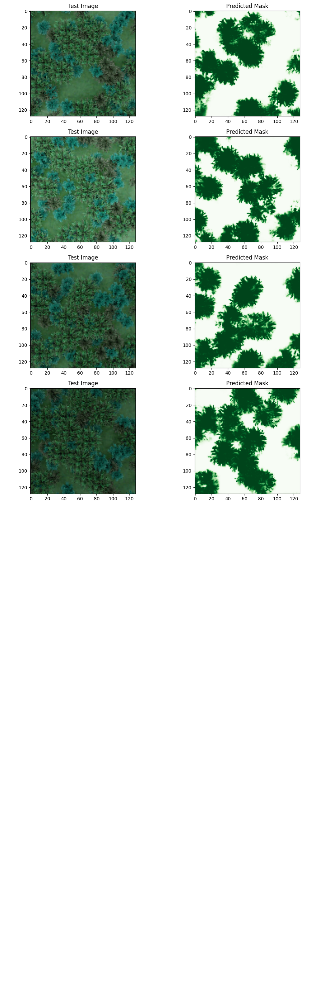

In [ ]:
# Generate predicted masks on test images
y_pred_test = model.predict(X_test[:4])

# Plot the predicted masks on the test images
fig, axes = plt.subplots(8, 2, figsize=(10, 30))
axes = axes.flatten()

# Plot the test images and predicted masks one by one
for i, ax in enumerate(axes):
    if i < len(y_pred_test) * 2:
        if i % 2 == 0:
            ax.imshow(X_test[i // 2])
            ax.set_title('Test Image')
        else:
            ax.imshow(y_pred_test[i // 2].squeeze(), cmap='Greens')
            ax.set_title('Predicted Mask')
    else:
        ax.axis('off')  # Disable empty subplots

# Show the images and predicted masks
plt.tight_layout()
plt.show()


## Basic U-NET with binary focal loss and augmentation

### 1 - Adding data augmentation

In [ ]:
# Data augmentation
data_gen_args = dict(
    rotation_range=90,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True
)

image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen = ImageDataGenerator(**data_gen_args)

# Fit the augmentation parameters on the training data
image_datagen.fit(X_train, augment=True, seed=42)
mask_datagen.fit(y_train, augment=True, seed=42)

image_generator = image_datagen.flow(X_train, seed=42, batch_size=32)
mask_generator = mask_datagen.flow(y_train, seed=42, batch_size=32)

# Combine the generators into one
train_generator = zip(image_generator, mask_generator)

In [ ]:
# Reset the index of df_filtered
df_filtered = df_filtered.reset_index(drop=True)
# # Save the DataFrame to a CSV file
df_filtered.to_csv('filtered_results.csv', index=False)


### 2 - Training and plot

Epoch 1/10
100/100 [==============================] - 50s 465ms/step - loss: 104.1039 - accuracy: 0.6473 - mean_io_u_2: 0.2825 - val_loss: 4.8491 - val_accuracy: 0.8728 - val_mean_io_u_2: 0.2729
Epoch 2/10
100/100 [==============================] - 46s 460ms/step - loss: 3.7073 - accuracy: 0.8835 - mean_io_u_2: 0.2729 - val_loss: 3.1661 - val_accuracy: 0.9105 - val_mean_io_u_2: 0.2729
Epoch 3/10
100/100 [==============================] - 46s 464ms/step - loss: 2.8061 - accuracy: 0.9082 - mean_io_u_2: 0.2729 - val_loss: 2.5545 - val_accuracy: 0.9147 - val_mean_io_u_2: 0.2729
Epoch 4/10
100/100 [==============================] - 45s 448ms/step - loss: 2.4407 - accuracy: 0.9179 - mean_io_u_2: 0.2729 - val_loss: 2.3231 - val_accuracy: 0.9169 - val_mean_io_u_2: 0.2729
Epoch 5/10
100/100 [==============================] - 45s 450ms/step - loss: 2.2265 - accuracy: 0.9246 - mean_io_u_2: 0.2729 - val_loss: 2.1633 - val_accuracy: 0.9218 - val_mean_io_u_2: 0.2729
Epoch 6/10
100/100 [=============

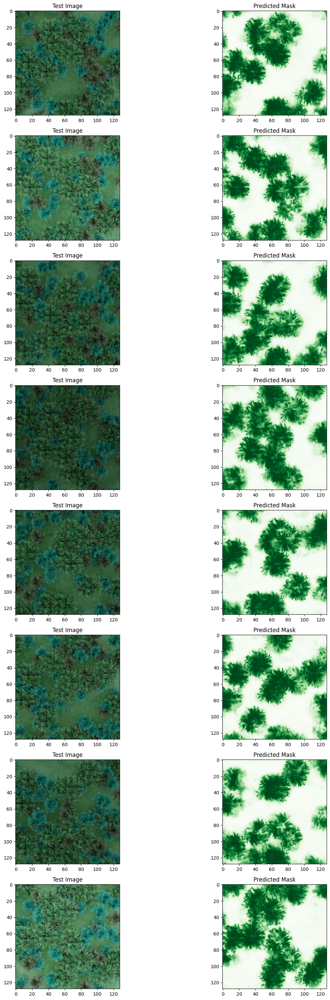

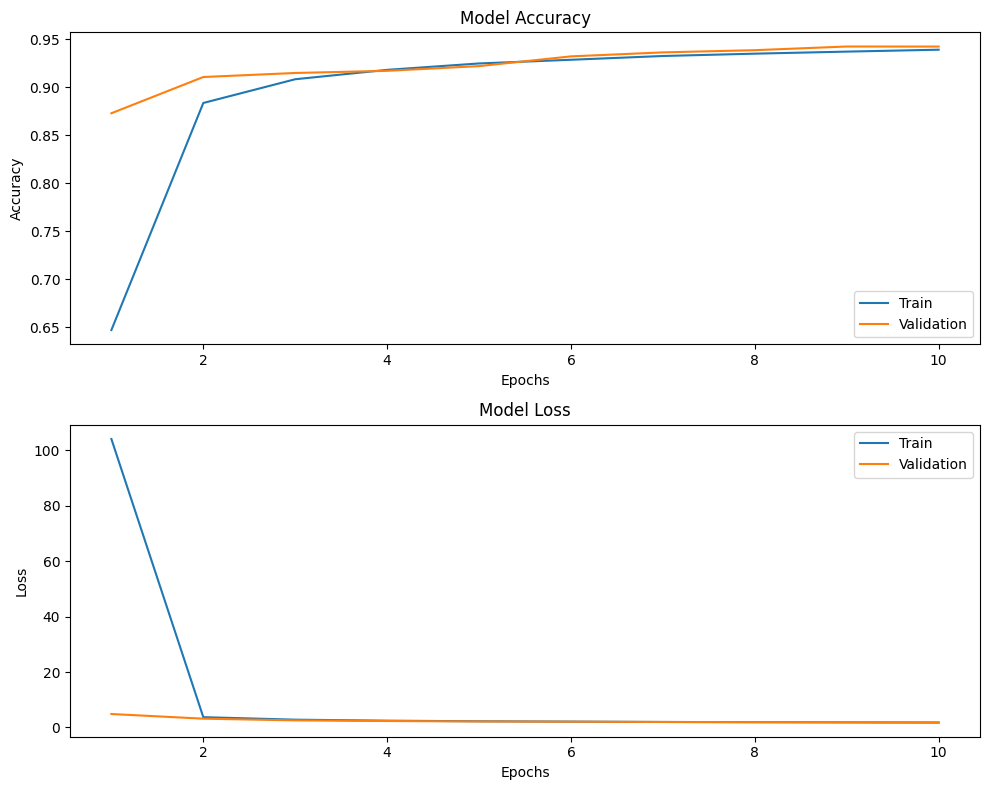

Epoch 1/10
100/100 [==============================] - 52s 482ms/step - loss: 25.0985 - accuracy: 0.5419 - mean_io_u_3: 0.3139 - val_loss: 5.0794 - val_accuracy: 0.8217 - val_mean_io_u_3: 0.2729
Epoch 2/10
100/100 [==============================] - 48s 478ms/step - loss: 4.3431 - accuracy: 0.7129 - mean_io_u_3: 0.3110 - val_loss: 4.7859 - val_accuracy: 0.8325 - val_mean_io_u_3: 0.2729
Epoch 3/10
100/100 [==============================] - 48s 478ms/step - loss: 3.6191 - accuracy: 0.7371 - mean_io_u_3: 0.3112 - val_loss: 4.2210 - val_accuracy: 0.8348 - val_mean_io_u_3: 0.2729
Epoch 4/10
100/100 [==============================] - 48s 478ms/step - loss: 3.3152 - accuracy: 0.7454 - mean_io_u_3: 0.3110 - val_loss: 4.4573 - val_accuracy: 0.8133 - val_mean_io_u_3: 0.2729
Epoch 5/10
100/100 [==============================] - 48s 479ms/step - loss: 3.1763 - accuracy: 0.7495 - mean_io_u_3: 0.3112 - val_loss: 4.0651 - val_accuracy: 0.8476 - val_mean_io_u_3: 0.2729
Epoch 6/10
100/100 [==============

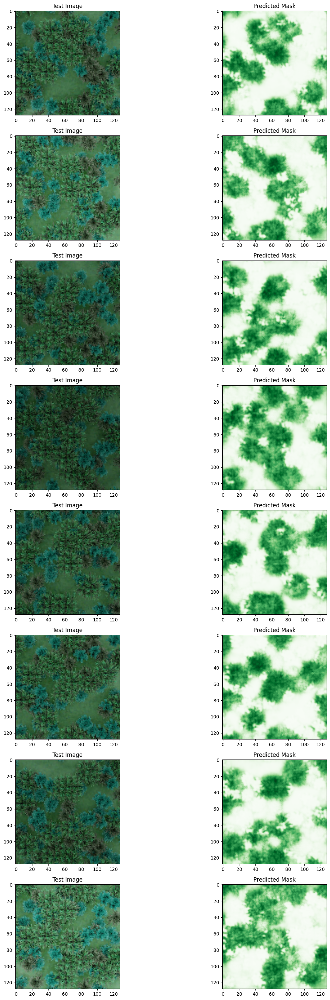

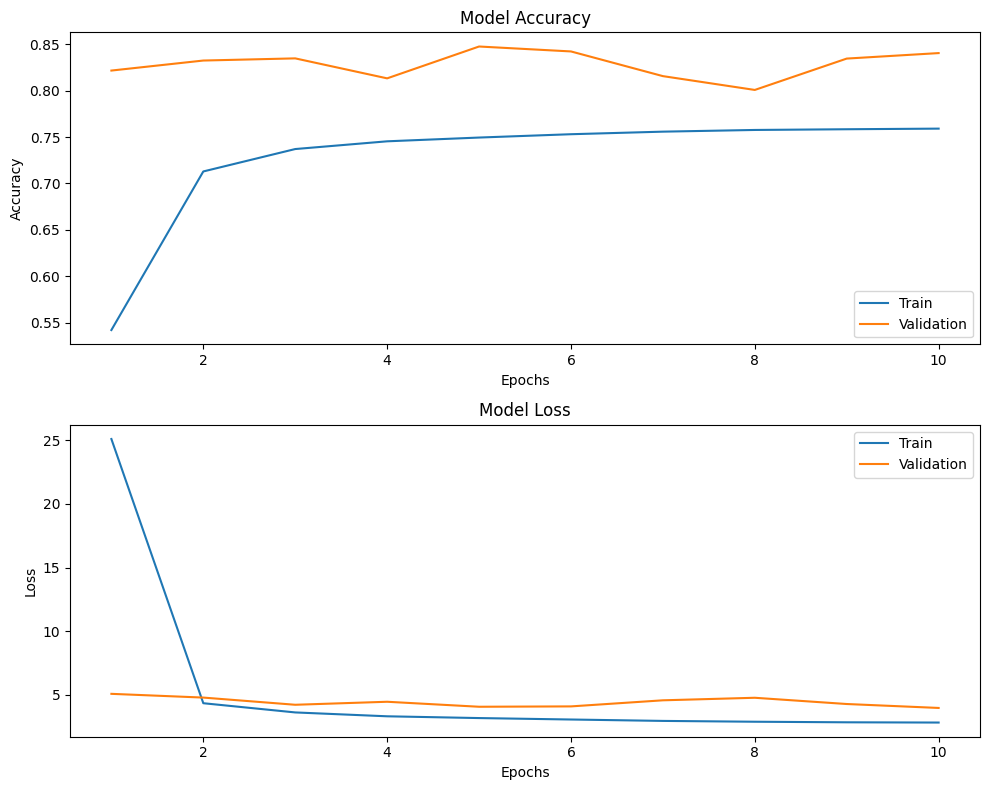

In [ ]:
# Lists to store accuracy and loss for each model
accuracy_list = []
loss_list = []
history_list = []

# Set the parameters to tune
filter = 64  # Number of filters in the first convolutional layer
batch_size = 32
dropout_list = [False, True]  # Whether to include dropout or not
learning_rate = 0.001  # Learning rate

# Create a list to store the accuracy and loss for each model
data = []

# Sort the DataFrame by history_key
df_sorted = df.sort_values(by='history_key')

# Filter the DataFrame to include the rows with the desired history_key
desired_keys = ["unet_drop_64_True_0.001_aug", "unet_drop_64_False_0.001_aug"]  # Change the desired history_keys as needed
df_filtered = df_sorted[df_sorted['history_key'].isin(desired_keys)]

# Reset the index of the filtered DataFrame
df_filtered.reset_index(drop=True, inplace=True)


def binary_focal_loss(gamma=2., alpha=.25):
    """
    Binary form of focal loss.

      FL(p_t) = -alpha * (1 - p_t)**gamma * log(p_t)

      where p = sigmoid(x), p_t = p or 1 - p depending on if the label is 1 or 0, respectively.

    References:
        https://arxiv.org/pdf/1708.02002.pdf
    Usage:
     model.compile(loss=[binary_focal_loss(alpha=.25, gamma=2)], metrics=["accuracy"], optimizer=adam)

    """

    def binary_focal_loss_fixed(y_true, y_pred):
        """
        :param y_true: A tensor of the same shape as `y_pred`
        :param y_pred:  A tensor resulting from a sigmoid
        :return: Output tensor.
        """
        y_true = tf.cast(y_true, tf.float32)
        # Define epsilon so that the back-propagation will not result in NaN for 0 divisor case
        epsilon = K.epsilon()
        # Add the epsilon to prediction value
        # y_pred = y_pred + epsilon
        # Clip the prediciton value
        y_pred = K.clip(y_pred, epsilon, 1.0 - epsilon)
        # Calculate p_t
        p_t = tf.where(K.equal(y_true, 1), y_pred, 1 - y_pred)
        # Calculate alpha_t
        alpha_factor = K.ones_like(y_true) * alpha
        alpha_t = tf.where(K.equal(y_true, 1), alpha_factor, 1 - alpha_factor)
        # Calculate cross entropy
        cross_entropy = -K.log(p_t)
        weight = alpha_t * K.pow((1 - p_t), gamma)
        # Calculate focal loss
        loss = weight * cross_entropy
        # Sum the losses in mini_batch
        loss = K.mean(K.sum(loss, axis=1))
        return loss

    return binary_focal_loss_fixed








# Iterate over the parameter combinations
for dropout in dropout_list:
    # Create the U-Net model
    model = unet(dropout=dropout, filters=filter)

    # Compile the model with F1 loss
    model.compile(optimizer=Adam(learning_rate), loss=[binary_focal_loss(alpha=.25, gamma=2)], metrics=['accuracy', MeanIoU(num_classes=2)], run_eagerly=True)

    # Train the model
    # Save the model based on learning rate and dropout
    if dropout:
        history = model.fit(train_generator, steps_per_epoch=len(X_train) // batch_size, epochs=10, validation_data=(X_val, y_val))
        dropout_aug = f"model_aug_{learning_rate}_dropout.h5"
        model.save(dropout_aug)
    else:
        history = model.fit(X_train, y_train, batch_size=batch_size, epochs=10, validation_data=(X_val, y_val))
        no_dropout_aug = f"model_aug_{learning_rate}_no_dropout.h5"
        model.save(no_dropout_aug)

    # Append the history object to the list
    history_list.append(history)

    # Append the accuracy and loss values to the lists
    accuracy_list.extend(history.history['accuracy'])
    loss_list.extend(history.history['loss'])

    # Generate predicted masks on training images
    y_pred_test = model.predict(X_test[:8])

    # Plot the predicted masks
    fig, axes = plt.subplots(8, 2, figsize=(15, 30))
    axes = axes.flatten()

    # Plot the test images and predicted masks one by one
    for i, ax in enumerate(axes):
        if i % 2 == 0:
            ax.imshow(X_test[i // 2])
            ax.set_title('Test Image')
        else:
            ax.imshow(y_pred_test[i // 2].squeeze(), cmap='Greens')
            ax.set_title('Predicted Mask')

    # Show the images and predicted masks
    plt.tight_layout()
    plt.show()

    # Plot accuracy and loss per epoch
    fig, axes = plt.subplots(2, 1, figsize=(10, 8))

    # Accuracy plot
    epochs = range(1, len(history.history['accuracy']) + 1)
    axes[0].plot(epochs, history.history['accuracy'], label='Train')
    axes[0].plot(epochs, history.history['val_accuracy'], label='Validation')
    axes[0].set_title('Model Accuracy')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].legend()

    # Loss plot
    axes[1].plot(epochs, history.history['loss'], label='Train')
    axes[1].plot(epochs, history.history['val_loss'], label='Validation')
    axes[1].set_title('Model Loss')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].legend()

    plt.tight_layout()
    plt.savefig(f'accuracy_loss_per_epoch_plot_{dropout}.png')  # Save the plot as an image
    plt.show()

    # Create a key for the history based on the parameters
    history_key = f"unet_drop_{filter}_{dropout}_{learning_rate}_new"  # Add a suffix to differentiate from existing keys

    # Append the accuracy and loss history to the data list
    for i, (acc, loss) in enumerate(zip(history.history['accuracy'], history.history['loss'])):
        data.append({'history_key': history_key, 'epoch': i+1, 'accuracy': acc, 'loss': loss})

# Create a DataFrame from the data list
df = pd.DataFrame(data)

# Concatenate the new data with the existing filtered data
df_filtered = pd.concat([df_filtered, df[df['history_key'].isin([f"{k}_new" for k in desired_keys])]])

# Reset the index of the filtered DataFrame
df_filtered.reset_index(drop=True, inplace=True)


In [ ]:
import pandas as pd

# Assuming your DataFrame is named 'df'
df['history_key'] = df['history_key'].str.replace('_new', '_aug')
import pandas as pd

# Assuming your DataFrame is named 'df' and the file name is 'filtered_results.csv'
filtered_results = pd.read_csv('filtered_results.csv')

# Merge the DataFrames based on the 'history_key' column
merged_df = pd.concat([df, filtered_results], ignore_index=True)
merged_df.to_csv('merged_df.csv', index=False)

## Create a U-Net where the encoder part of the U-Net uses a pre-trained VGG16

### 1 - Model definition

In [ ]:
import tensorflow as tf

# Load the pre-trained VGG16 model
vgg16 = tf.keras.applications.VGG16(include_top=False, weights='imagenet', input_shape=(128, 128, 3))

# Freeze the weights of the pre-trained VGG16 model
vgg16.trainable = False

# Create the U-Net model architecture
inputs = tf.keras.layers.Input(shape=(128, 128, 3))

# Encoder
encoder = vgg16(inputs)
encoder = tf.keras.layers.Conv2D(512, 3, activation='relu', padding='same')(encoder)
encoder = tf.keras.layers.Conv2D(512, 3, activation='relu', padding='same')(encoder)

# Decoder
decoder = tf.keras.layers.Conv2DTranspose(512, 3, strides=2, activation='relu', padding='same')(encoder)
decoder = tf.keras.layers.Conv2D(512, 3, activation='relu', padding='same')(decoder)
decoder = tf.keras.layers.Conv2D(512, 3, activation='relu', padding='same')(decoder)
decoder = tf.keras.layers.Conv2DTranspose(256, 3, strides=2, activation='relu', padding='same')(decoder)
decoder = tf.keras.layers.Conv2D(256, 3, activation='relu', padding='same')(decoder)
decoder = tf.keras.layers.Conv2D(256, 3, activation='relu', padding='same')(decoder)
decoder = tf.keras.layers.Conv2DTranspose(128, 3, strides=2, activation='relu', padding='same')(decoder)
decoder = tf.keras.layers.Conv2D(128, 3, activation='relu', padding='same')(decoder)
decoder = tf.keras.layers.Conv2D(128, 3, activation='relu', padding='same')(decoder)
decoder = tf.keras.layers.Conv2DTranspose(64, 3, strides=2, activation='relu', padding='same')(decoder)
decoder = tf.keras.layers.Conv2D(64, 3, activation='relu', padding='same')(decoder)
decoder = tf.keras.layers.Conv2D(64, 3, activation='relu', padding='same')(decoder)
decoder = tf.keras.layers.Conv2DTranspose(32, 3, strides=2, activation='relu', padding='same')(decoder)
decoder = tf.keras.layers.Conv2D(32, 3, activation='relu', padding='same')(decoder)
decoder = tf.keras.layers.Conv2D(32, 3, activation='relu', padding='same')(decoder)

# Output
outputs = tf.keras.layers.Conv2D(1, 1, activation='sigmoid')(decoder)

# Create the model
model = tf.keras.models.Model(inputs=inputs, outputs=outputs)


58889256/58889256 [==============================] - 2s 0us/step


### 2 - Training and plot

Epoch 1/10
100/100 [==============================] - 36s 311ms/step - loss: 0.5204 - accuracy: 0.8376 - val_loss: 0.2338 - val_accuracy: 0.9056
Epoch 2/10
100/100 [==============================] - 31s 314ms/step - loss: 0.1989 - accuracy: 0.9201 - val_loss: 0.1837 - val_accuracy: 0.9256
Epoch 3/10
100/100 [==============================] - 32s 323ms/step - loss: 0.1727 - accuracy: 0.9299 - val_loss: 0.1659 - val_accuracy: 0.9328
Epoch 4/10
100/100 [==============================] - 33s 332ms/step - loss: 0.1580 - accuracy: 0.9357 - val_loss: 0.1514 - val_accuracy: 0.9382
Epoch 5/10
100/100 [==============================] - 33s 331ms/step - loss: 0.1487 - accuracy: 0.9393 - val_loss: 0.1438 - val_accuracy: 0.9412
Epoch 6/10
100/100 [==============================] - 33s 329ms/step - loss: 0.1411 - accuracy: 0.9422 - val_loss: 0.1436 - val_accuracy: 0.9412
Epoch 7/10
100/100 [==============================] - 33s 330ms/step - loss: 0.1350 - accuracy: 0.9445 - val_loss: 0.1316 - val_ac

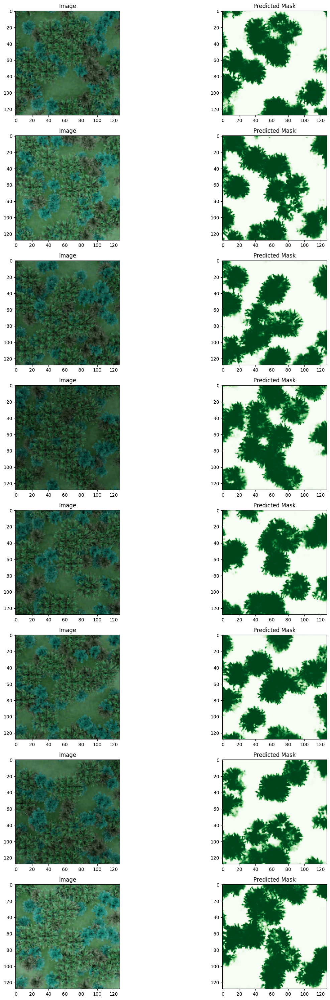

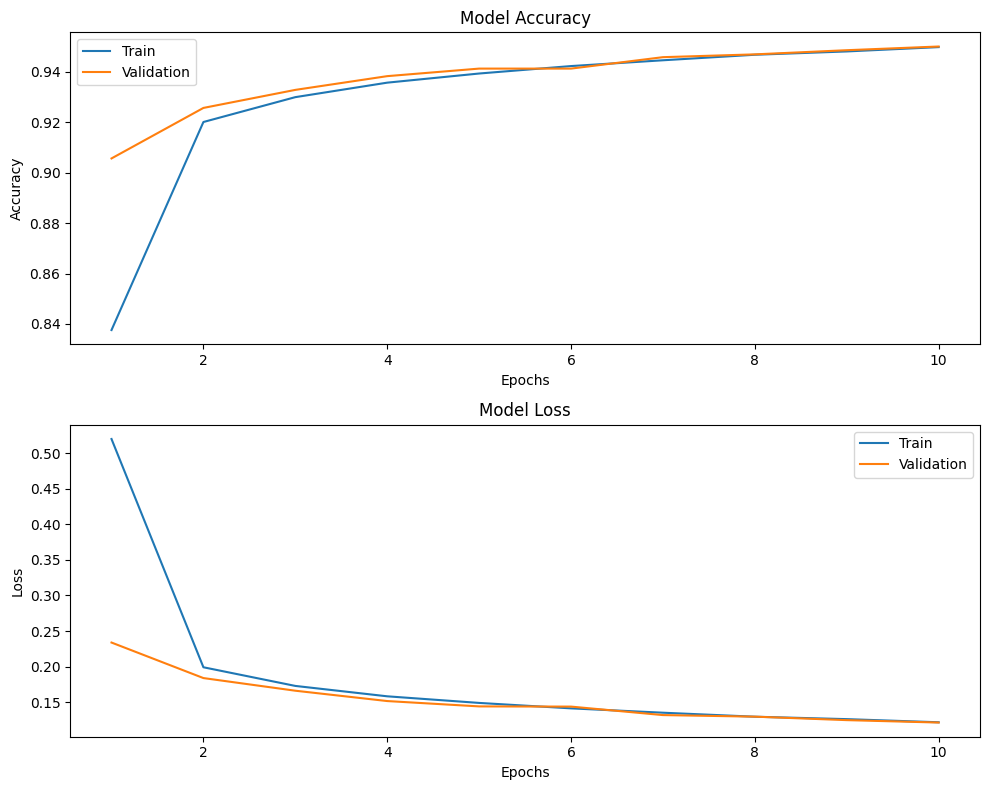

In [ ]:
# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(), loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, batch_size=32, epochs=10, validation_data=(X_val, y_val))
# Create a key for the history based on the parameters
history_key = f"VGG16"  # Add a suffix to differentiate from existing keys

# Append the accuracy and loss history to the data list
for i, (acc, loss) in enumerate(zip(history.history['accuracy'], history.history['loss'])):
    data.append({'history_key': history_key, 'epoch': i+1, 'accuracy': acc, 'loss': loss})

# Create a DataFrame from the data list
df = pd.DataFrame(data)

# Concatenate the new data with the existing filtered data
df_filtered = pd.concat([df_filtered, df[df['history_key'].isin([f"{k}_new" for k in desired_keys])]])

# Reset the index of the filtered DataFrame
df_filtered.reset_index(drop=True, inplace=True)

# Generate predicted masks on test images
y_pred_test = model.predict(X_test[:8])

# Plot the predicted masks
fig, axes = plt.subplots(8, 2, figsize=(15, 30))
axes = axes.flatten()

for i, ax in enumerate(axes):
    if i % 2 == 0:
        ax.imshow(X_test[i // 2])
        ax.set_title('Image')
    else:
        ax.imshow(y_pred_test[i // 2].squeeze(), cmap='Greens')
        ax.set_title('Predicted Mask')


plt.tight_layout()
plt.savefig('accuracy_loss_plot.png')  # Save the plot as an image
plt.show()

# Plot accuracy and loss per epoch
fig, axes = plt.subplots(2, 1, figsize=(10, 8))

# Accuracy plot
epochs = range(1, len(history.history['accuracy']) + 1)
axes[0].plot(epochs, history.history['accuracy'], label='Train')
axes[0].plot(epochs, history.history['val_accuracy'], label='Validation')
axes[0].set_title('Model Accuracy')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

# Loss plot
axes[1].plot(epochs, history.history['loss'], label='Train')
axes[1].plot(epochs, history.history['val_loss'], label='Validation')
axes[1].set_title('Model Loss')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('Loss')
axes[1].legend()

plt.tight_layout()
plt.savefig('accuracy_loss_per_epoch_plot.png')  # Save the plot as an image
plt.show()


In [ ]:
new_df = df[df['history_key'] == 'VGG16']
merged_df = pd.read_csv('merged_df.csv')

t = pd.concat([new_df, merged_df], ignore_index=True)
t.to_csv('merged_df_final.csv', index=False)


,history_key,epoch,accuracy,loss
0,VGG16,1,0.837588,0.520351
1,VGG16,2,0.920056,0.198947
2,VGG16,3,0.929910,0.172675
3,VGG16,4,0.935656,0.158044
4,VGG16,5,0.939279,0.148742
5,VGG16,6,0.942232,0.141078
6,VGG16,7,0.944526,0.134959
7,VGG16,8,0.946715,0.129318
8,VGG16,9,0.948029,0.125907
9,VGG16,10,0.949746,0.121496


## Final plot

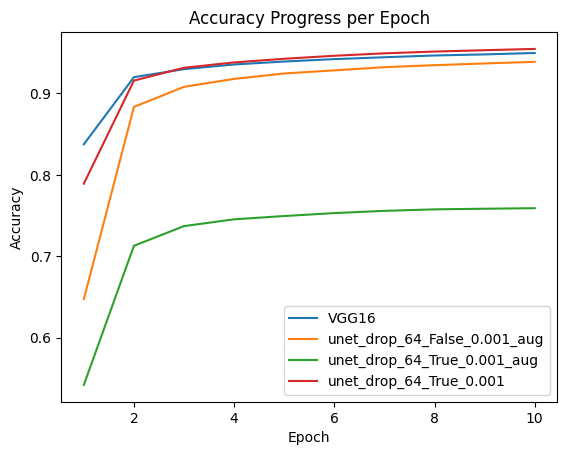

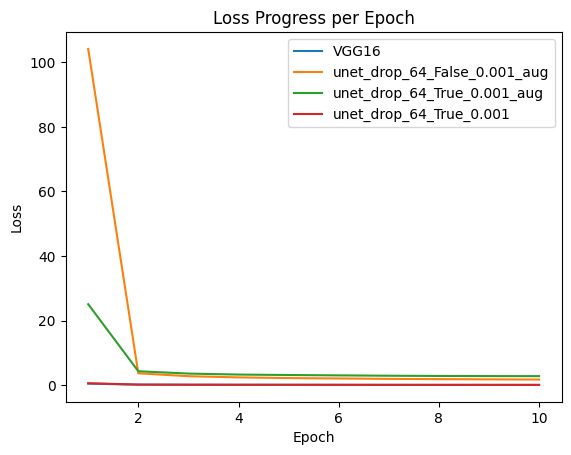

In [ ]:
import pandas as pd

# Load the "filtered_results.csv" file
filtered_results = pd.read_csv('/content/merged_df_final.csv')

# Merge the filtered_results DataFrame with the existing df DataFrame
merged_df =filtered_results

# Plot the accuracy values for each key
for key in merged_df['history_key'].unique():
    accuracy_values = merged_df[merged_df['history_key'] == key]['accuracy']
    plt.plot(range(1, len(accuracy_values) + 1), accuracy_values, label=key)

plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Accuracy Progress per Epoch')
plt.show()

# Plot the loss values for each key
for key in merged_df['history_key'].unique():
    loss_values = merged_df[merged_df['history_key'] == key]['loss']
    plt.plot(range(1, len(loss_values) + 1), loss_values, label=key)

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss Progress per Epoch')
plt.show()
